In [3]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [5]:
## Step 1: Load Images
#Let's load the images and convert them to RGB format for easier visualization in matplotlib.


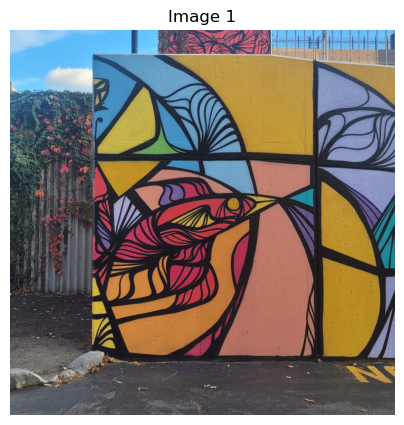

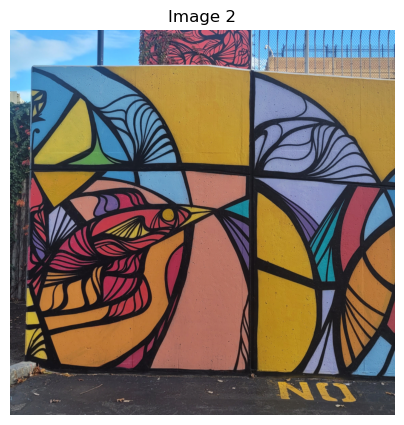

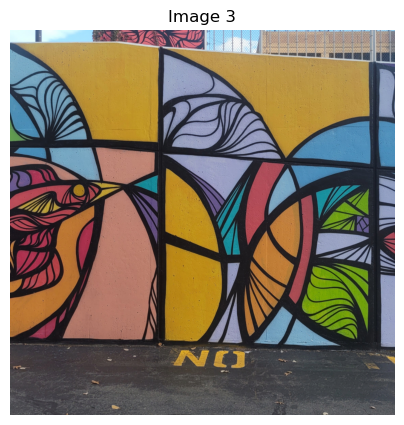

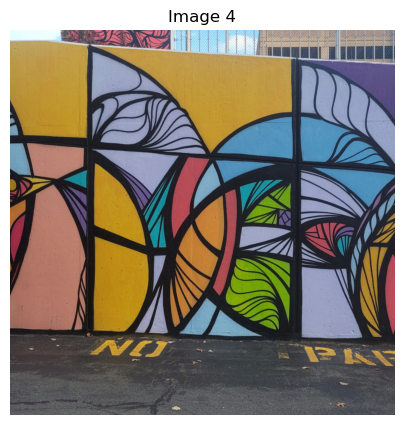

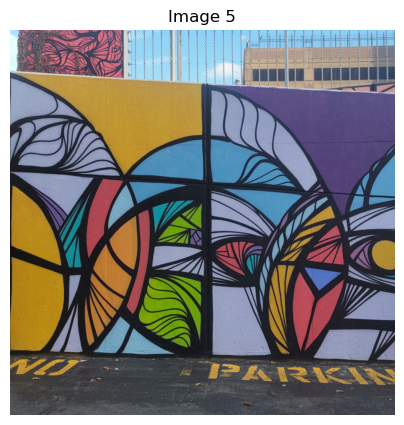

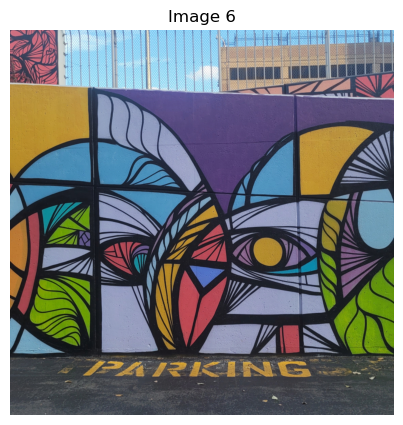

In [7]:
# Load images from paths and convert to RGB
def load_images(image_paths):
    images = []
    for path in image_paths:
        img = cv2.imread(path)
        if img is None:
            print(f"Warning: Unable to load image at path {path}")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)
    return images

# Define the image paths (adjust these paths to your specific files)
image_paths = [
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data\image_1-1.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data\image_2-1.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data\image_3-1.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data\image_4-1.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data\image_5-1.jpg",
    r"C:\Users\ragsh\Desktop\FALL 24\RSN\LAB5\data\image_6-1.jpg"
]

# Load and display images
images = load_images(image_paths)
for i, img in enumerate(images):
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f"Image {i+1}")
    plt.axis("off")
    plt.show()


In [9]:
## Step 2: Detect Harris Corners
#Using Harris Corner Detection, let's visualize the keypoints detected in each image.


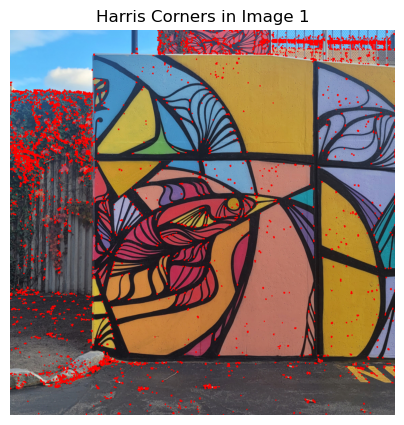

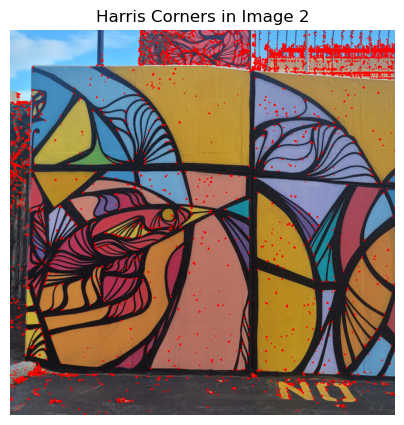

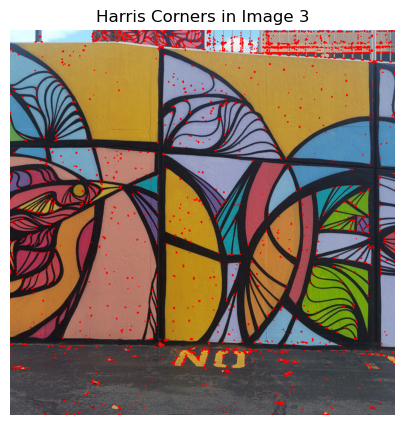

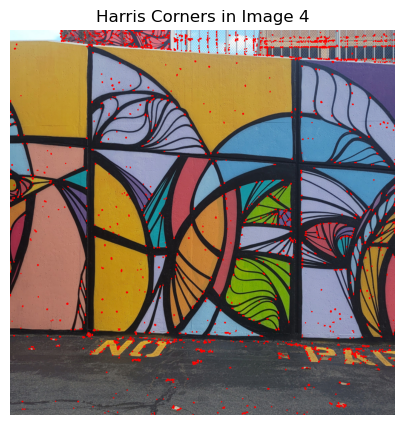

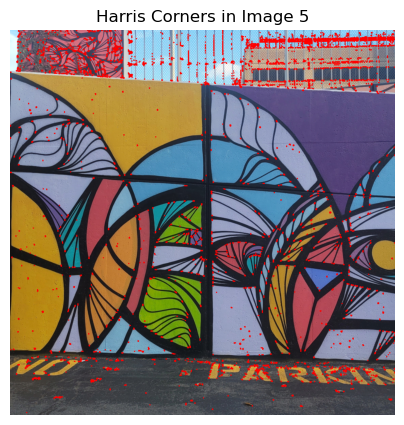

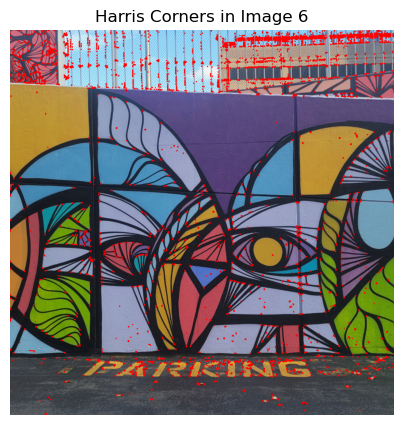

In [11]:
# Detect and visualize Harris corners
def detect_harris_corners(image, harris_threshold=0.01):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    harris_corners = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
    harris_corners = cv2.dilate(harris_corners, None)

    # Mark keypoints on the original image
    img_with_corners = image.copy()
    img_with_corners[harris_corners > harris_threshold * harris_corners.max()] = [255, 0, 0]
    return img_with_corners, harris_corners

# Display Harris corners for each image
harris_threshold = 0.01
for i, img in enumerate(images):
    img_with_corners, _ = detect_harris_corners(img, harris_threshold)
    plt.figure(figsize=(5, 5))
    plt.imshow(img_with_corners)
    plt.title(f"Harris Corners in Image {i+1}")
    plt.axis("off")
    plt.show()


In [13]:
## Step 3: Compute ORB Descriptors for Harris Keypoints
#Now we’ll use ORB to compute descriptors for the keypoints detected by Harris Corner Detection and visualize them as well.


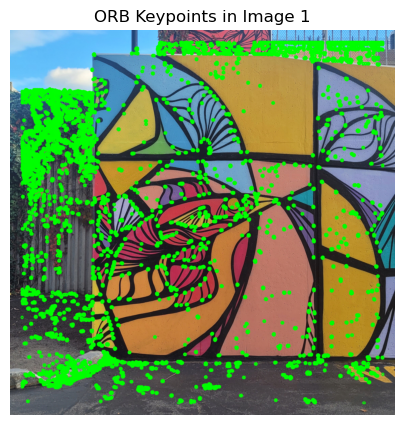

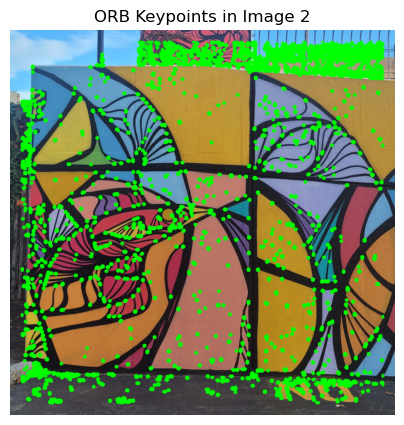

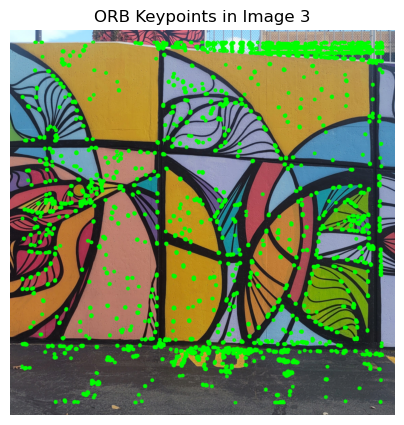

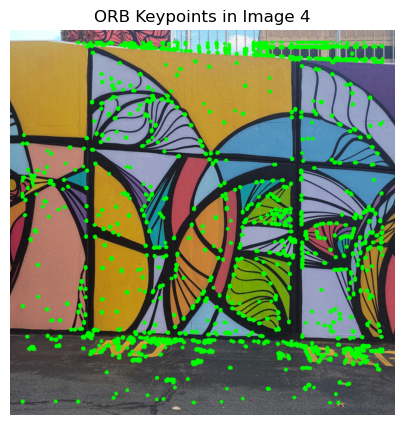

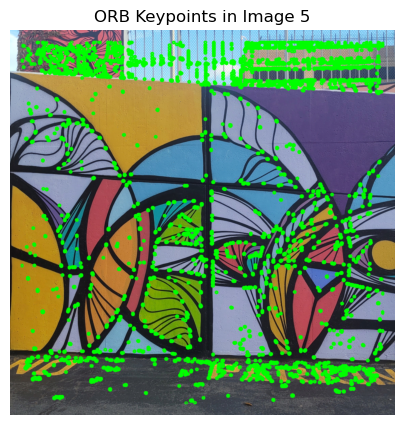

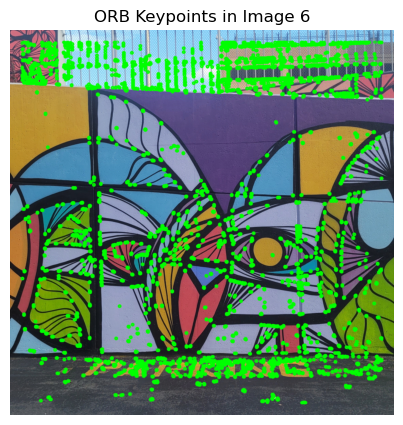

In [15]:
# Detect keypoints and compute descriptors using Harris corners and ORB
def detect_and_compute_keypoints(image, harris_threshold=0.01, orb_features=1000):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = np.float32(gray)
    harris_corners = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
    harris_corners = cv2.dilate(harris_corners, None)

    # Extract strong corners above threshold
    keypoints = np.argwhere(harris_corners > harris_threshold * harris_corners.max())
    keypoints = [cv2.KeyPoint(float(x[1]), float(x[0]), 1) for x in keypoints]

    # Compute descriptors for detected keypoints with ORB
    orb = cv2.ORB_create(nfeatures=orb_features)
    keypoints, descriptors = orb.compute(image, keypoints)
    return keypoints, descriptors

# Display ORB keypoints for each image
for i, img in enumerate(images):
    keypoints, _ = detect_and_compute_keypoints(img, harris_threshold)
    img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0))
    plt.figure(figsize=(5, 5))
    plt.imshow(img_with_keypoints)
    plt.title(f"ORB Keypoints in Image {i+1}")
    plt.axis("off")
    plt.show()


In [17]:
## Step 4: Stitch Images with RANSAC Homography Estimation
#We’ll match features between images using RANSAC to filter out outliers and stitch them together step-by-step. Each stitch step will display the intermediate result.


In [19]:
# Stitch images with RANSAC
def stitch_images(images, ransac_thresh=5.0):
    stitched_image = images[0]  # Initialize with the first image

    for i in range(1, len(images)):
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i])

        # Match features using Hamming distance
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(descriptors1, descriptors2)
        matches = sorted(matches, key=lambda x: x.distance)

        # Extract coordinates of matched points
        src_pts = np.float32([keypoints1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        # Find homography with RANSAC to align images
        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, ransac_thresh)
        
        # Warp the current image and blend it onto the stitched image canvas
        height, width, _ = stitched_image.shape
        warped_image = cv2.warpPerspective(images[i], H, (width + images[i].shape[1], height))

        # Overlay stitched image to form the panorama
        warped_image[0:height, 0:width] = stitched_image
        stitched_image = crop_black_borders(warped_image)  # Crop out excess borders

        # Display intermediate stitched result
        plt.figure(figsize=(10, 5))
        plt.imshow(stitched_image)
        plt.title(f"Stitched Image after Adding Image {i+1}")
        plt.axis("off")
        plt.show()

    return stitched_image


In [21]:
## Step 5: Define Helper Function to Crop Black Borders
#The stitched images may have black borders due to perspective transformation. We'll crop them out for a cleaner final result.


In [25]:
## Step 6: Run the Full Stitching Process
#Finally, we run the stitching function on our list of images and display the completed panorama.


In [23]:
# Crop black borders from the stitched panorama for a cleaner look
def crop_black_borders(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        x, y, w, h = cv2.boundingRect(contours[0])
        return image[y:y+h, x:x+w]
    return image


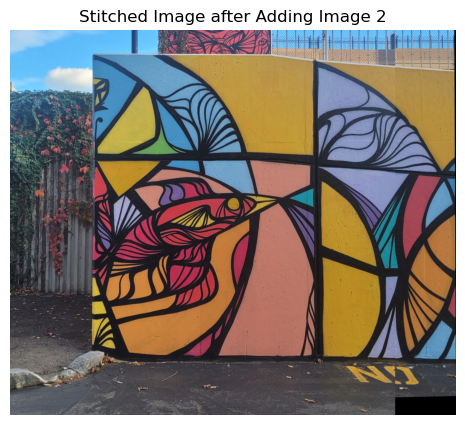

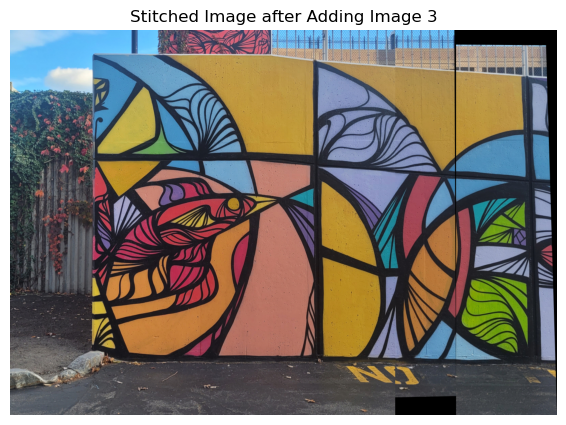

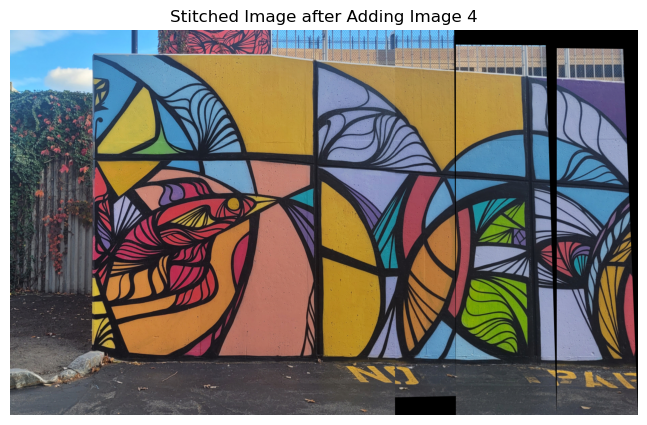

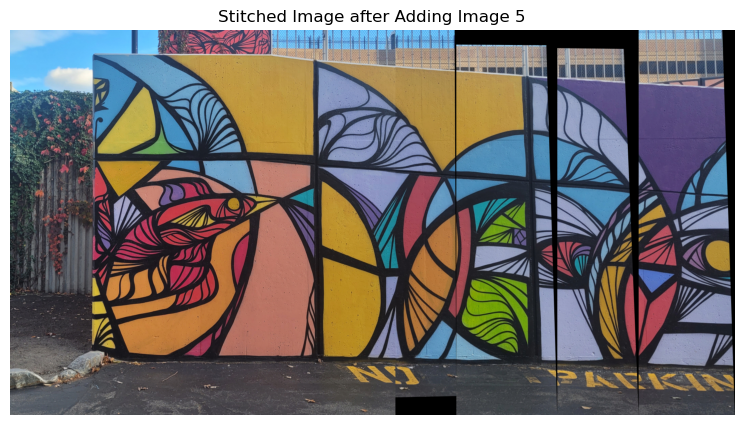

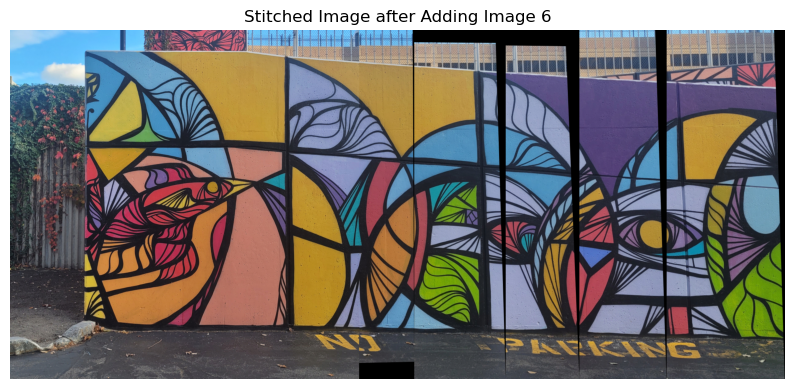

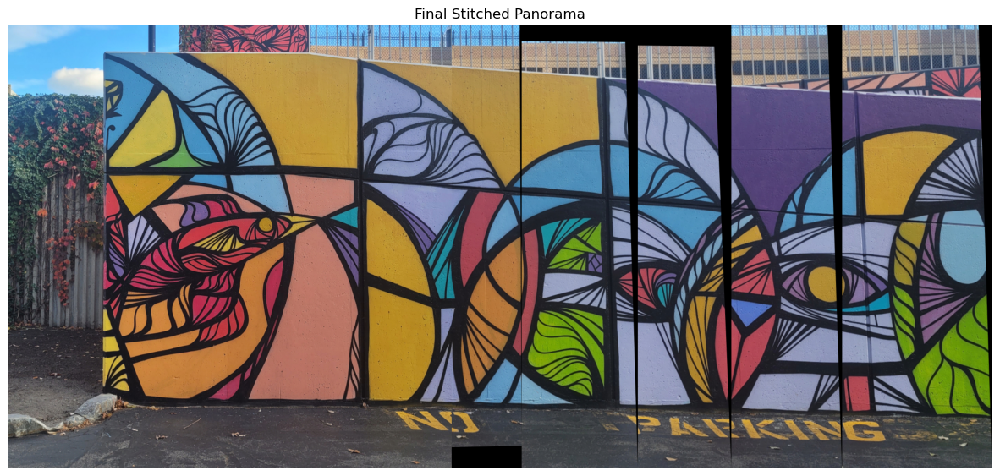

In [27]:
# Execute the full stitching process
ransac_threshold = 5.0  # Adjust based on overlap (higher for less overlap)
stitched_image = stitch_images(images, ransac_thresh=ransac_threshold)

# Display the final stitched image
plt.figure(figsize=(15, 7))
plt.imshow(stitched_image)
plt.title("Final Stitched Panorama")
plt.axis("off")
plt.show()
